<a href="https://colab.research.google.com/github/Spookytober/Datascience/blob/main/Aubr_OrfU9Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predicting Salinity - Imports and decisions

In [1]:
#imports
import torch
import numpy as np
from torch import nn
import pandas as pd
import sklearn
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

I'm using the same river bouy dataset that I used last time, because I feel like there's more to learn from it. I also really want to try using a neural network with this dataset, since it seems really interesting to me.

In [2]:
dmcr = pd.read_csv("https://raw.githubusercontent.com/Spookytober/Datascience/refs/heads/main/DMCRiverNN.csv")
dmcr

,Date,Time,Temperature,SpecificConductance,Salinity,DOpercent,DOmgl,pHmV,pH,Turbidity,...,Chlorophyllugl,fDOM (RFU),fDOM (QSU),Wind direction,Wind speed (m/s),AirTemp,RelHumidity,BarometricPressurehPA,SolarRadiationWm2,NitrateuM
0,04/09/2025,6:00:00 AM,4.543,45795.1,29.03,103.63,11.02,-70.19,8.02,2.04,...,0.47,1.85,4.82,301,6.18,-2.7,83,1014.5,53,9.99
1,04/09/2025,5:00:00 AM,4.585,45584.0,28.89,103.52,11.01,-70.29,8.02,1.92,...,-0.28,1.90,5.00,298,6.34,-2.4,84,1012.7,1,9.86
2,04/09/2025,4:00:00 AM,4.635,45335.2,28.72,103.90,11.05,-70.48,8.02,1.98,...,-0.33,1.99,5.31,313,5.05,-2.3,86,1011.3,0,10.63
3,04/09/2025,3:00:00 AM,4.558,45886.1,29.10,103.54,11.00,-70.11,8.02,1.94,...,-0.28,1.82,4.74,300,4.73,-2.7,90,1009.9,0,9.57
4,04/09/2025,2:00:00 AM,4.183,46137.3,29.23,102.07,10.94,-70.43,8.02,1.86,...,0.04,1.96,5.19,307,4.04,-2.6,91,1008.9,0,10.13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1959,01/16/2025,6:00:00 PM,2.235,47848.0,30.12,98.56,11.02,-71.51,8.00,2.44,...,0.66,1.50,7.49,6,1.41,-5.8,88,1010.2,0,15.45
1960,01/16/2025,5:00:00 PM,2.306,47907.4,30.17,98.43,10.98,-71.48,8.00,2.69,...,0.55,1.47,7.37,25,0.96,-4.7,84,1010.3,0,15.56
1961,01/16/2025,4:00:00 PM,2.720,48527.6,30.67,98.20,10.80,-71.39,7.99,2.58,...,0.50,1.24,6.62,237,0.84,-3.4,71,1010.2,0,15.57
1962,01/16/2025,3:00:00 PM,3.136,48954.9,31.04,98.63,10.71,-71.28,7.99,2.18,...,0.53,1.03,5.91,246,1.63,-3.6,75,1010.0,0,15.30


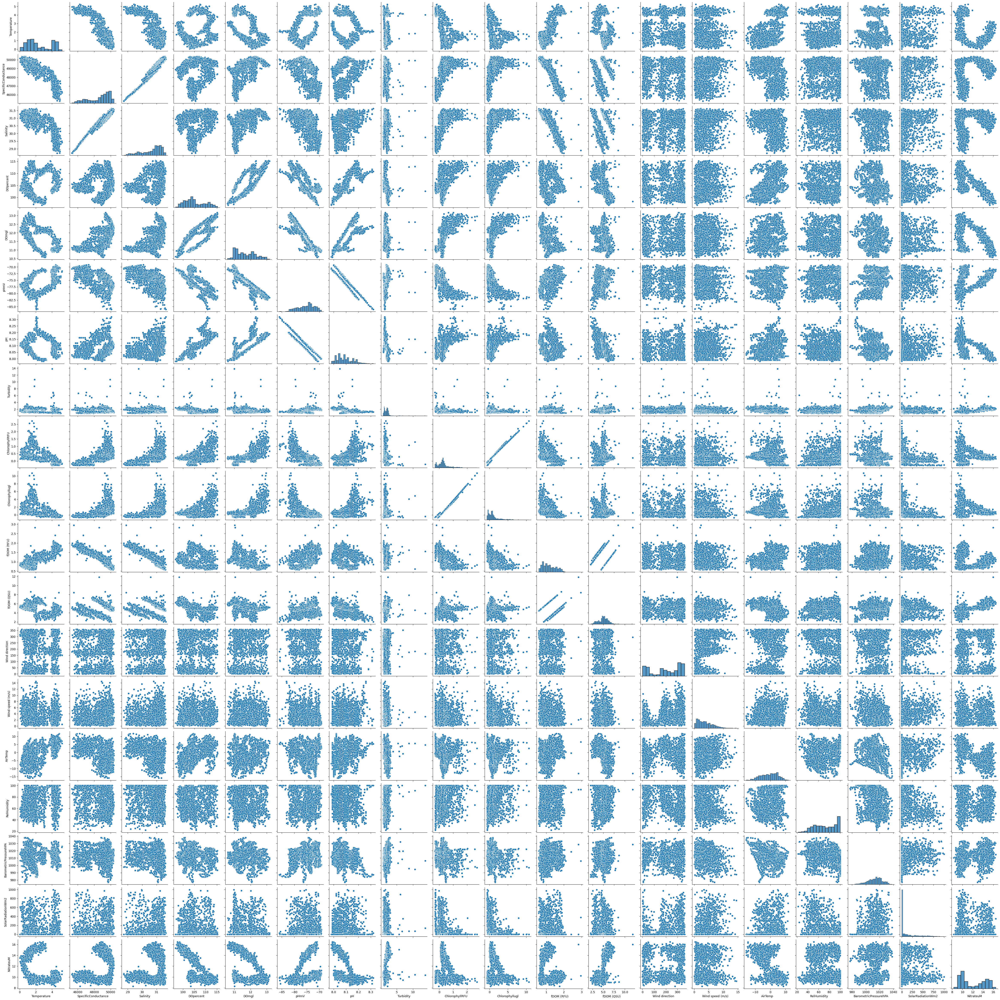

In [ ]:
sns.pairplot(dmcr)

This time, I'm going to predict salinity based on DO, temperature, Chlorophyll, Specific Conductance, fDOM, and pH. I'm making this decision based on three things: my knowledge of oceanic processes and oceanography, my pair plot above, and my previous experience with this dataset for the Unit 8 project. Last time I used this dataset, I predicted dissolved oxygen.

First things first, I'm going to get rid of a bunch of the unnecessary columns that are either redundant or not needed.

In [3]:
#dropping the unnecessary columns
dmcr.drop(columns=["Date","Time","DOpercent","pHmV","Turbidity", "ChlorophyllRFU","fDOM (QSU)","Wind direction","Wind speed (m/s)", "AirTemp", "RelHumidity","BarometricPressurehPA","SolarRadiationWm2","NitrateuM"],inplace=True)
dmcr.reset_index(drop=True,inplace=True)

In [ ]:
dmcr

,Temperature,SpecificConductance,Salinity,DOmgl,pH,Chlorophyllugl,fDOM (RFU)
0,4.543,45795.1,29.03,11.02,8.02,0.47,1.85
1,4.585,45584.0,28.89,11.01,8.02,-0.28,1.90
2,4.635,45335.2,28.72,11.05,8.02,-0.33,1.99
3,4.558,45886.1,29.10,11.00,8.02,-0.28,1.82
4,4.183,46137.3,29.23,10.94,8.02,0.04,1.96
...,...,...,...,...,...,...,...
1959,2.235,47848.0,30.12,11.02,8.00,0.66,1.50
1960,2.306,47907.4,30.17,10.98,8.00,0.55,1.47
1961,2.720,48527.6,30.67,10.80,7.99,0.50,1.24
1962,3.136,48954.9,31.04,10.71,7.99,0.53,1.03


In [4]:
#splitting up my dataset into two matrices
dmcr1 = dmcr[["Temperature","SpecificConductance","DOmgl","Chlorophyllugl","fDOM (RFU)"]]
dmcr2 = dmcr[["Salinity"]]

In [ ]:
d1_matrix = dmcr1.to_numpy()
d1_tensor = torch.from_numpy(d1_matrix)

In [ ]:
d2_matrix = dmcr2.to_numpy()
d2_tensor = torch.from_numpy(d2_matrix)

In [ ]:
X = d1_tensor
y = d2_tensor
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,)

# Attempt 1

In [ ]:
model_1 = nn.Sequential(
    #our input is a vector, so 1 diminsion.
    nn.Linear(in_features=5, out_features=32,),
    nn.RReLU(),

    #hidden layer with 32 nodes
    nn.Linear(in_features=32, out_features=16, ),
    nn.RReLU(),

    #moves to hidden layer with 16 nodes
    nn.Linear(in_features=16, out_features=8, ),
    nn.RReLU(),

    #hidden layer with 8 nodes
    nn.Linear(in_features=8, out_features=4, ),
    nn.RReLU(),

    #hidden layer with 4 nodes
    nn.Linear(in_features=4, out_features=1, ),
    #outputs a vector of predicted weights
)

In [ ]:
model_1 = model_1.double()

In [ ]:
# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer; SGD is stochastic gradient decent
optimizer = torch.optim.SGD(params=model_1.parameters(),
                            lr=0.0001)

In [ ]:
epochs = 2000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_1.train()

    # 1. Forward pass; makes predictions
    y_pred = model_1(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred.squeeze(), y_train)

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_1.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_1(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([1571, 1])) that is different to the input size (torch.Size([1571])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch: 0 | Train loss: 68570.12922, Test loss: 288211545245787127808.00000
Epoch: 200 | Train loss: nan, Test loss: nan
Epoch: 400 | Train loss: nan, Test loss: nan
Epoch: 600 | Train loss: nan, Test loss: nan
Epoch: 800 | Train loss: nan, Test loss: nan
Epoch: 1000 | Train loss: nan, Test loss: nan
Epoch: 1200 | Train loss: nan, Test loss: nan
Epoch: 1400 | Train loss: nan, Test loss: nan
Epoch: 1600 | Train loss: nan, Test loss: nan
Epoch: 1800 | Train loss: nan, Test loss: nan


# Attempt 2 - Maybe we scale it this time

Okay, awesome! Something tells me that didn't work! Maybe its the dozen "nan" readings I got.
I'm going to scale my data.

In [5]:
scaler = StandardScaler()
scaled_values = scaler.fit_transform(dmcr)
dmcr_s = pd.DataFrame(scaled_values, columns = dmcr.columns)
dmcr_s

,Temperature,SpecificConductance,Salinity,DOmgl,pH,Chlorophyllugl,fDOM (RFU)
0,1.473096,-2.183928,-2.354272,-1.083500,-1.071030,-0.348799,1.869388
1,1.501705,-2.346983,-2.556922,-1.100001,-1.071030,-0.813919,2.005927
2,1.535763,-2.539159,-2.802996,-1.033996,-1.071030,-0.844927,2.251697
3,1.483313,-2.113639,-2.252948,-1.116502,-1.071030,-0.813919,1.787465
4,1.227878,-1.919609,-2.064773,-1.215509,-1.071030,-0.615468,2.169774
...,...,...,...,...,...,...,...
1959,-0.099023,-0.598249,-0.776503,-1.083500,-1.384682,-0.230968,0.913615
1960,-0.050661,-0.552368,-0.704128,-1.149504,-1.384682,-0.299186,0.831692
1961,0.231340,-0.073320,0.019619,-1.446526,-1.541508,-0.330194,0.203613
1962,0.514703,0.256730,0.555192,-1.595037,-1.541508,-0.311589,-0.369851


In [6]:
dmcr1s = dmcr_s[["Temperature","SpecificConductance","DOmgl","Chlorophyllugl","fDOM (RFU)"]]
dmcr2s = dmcr_s[["Salinity"]]

In [7]:

d1s_matrix = dmcr1s.to_numpy()
d1s_tensor = torch.from_numpy(d1s_matrix)

d2s_matrix = dmcr2s.to_numpy()
d2s_tensor = torch.from_numpy(d2s_matrix)

X = d1s_tensor
y = d2s_tensor
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,)

In [8]:
model_2 = nn.Sequential(
    nn.Linear(in_features=5, out_features=32,),
    nn.RReLU(),

    #hidden layer with 32 nodes
    nn.Linear(in_features=32, out_features=16, ),
    nn.RReLU(),

    #moves to hidden layer with 16 nodes
    nn.Linear(in_features=16, out_features=8, ),
    nn.RReLU(),

    #hidden layer with 8 nodes
    nn.Linear(in_features=8, out_features=4, ),
    nn.RReLU(),

    #hidden layer with 4 nodes
    nn.Linear(in_features=4, out_features=1, ),
)
model_2 = model_2.double()

In [ ]:
# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer
optimizer = torch.optim.SGD(params=model_2.parameters(),
                            lr=0.0001)

NameError: name 'model_1' is not defined

In [ ]:
epochs = 2000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_2.train()

    # 1. Forward pass; makes predictions
    y_pred = model_2(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred.squeeze(), y_train)

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_2.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_2(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([1571, 1])) that is different to the input size (torch.Size([1571])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch: 0 | Train loss: 1.09030, Test loss: 1.05555
Epoch: 200 | Train loss: 1.09038, Test loss: 1.05555
Epoch: 400 | Train loss: 1.09041, Test loss: 1.05555
Epoch: 600 | Train loss: 1.09034, Test loss: 1.05555
Epoch: 800 | Train loss: 1.09048, Test loss: 1.05555
Epoch: 1000 | Train loss: 1.09052, Test loss: 1.05555
Epoch: 1200 | Train loss: 1.09012, Test loss: 1.05555
Epoch: 1400 | Train loss: 1.09029, Test loss: 1.05555
Epoch: 1600 | Train loss: 1.09050, Test loss: 1.05555
Epoch: 1800 | Train loss: 1.09029, Test loss: 1.05555


In [ ]:
# Turn on evaluation mode
model_2.eval()

# Make predictions (inference)
with torch.inference_mode():
    y_preds = model_2(X_test)

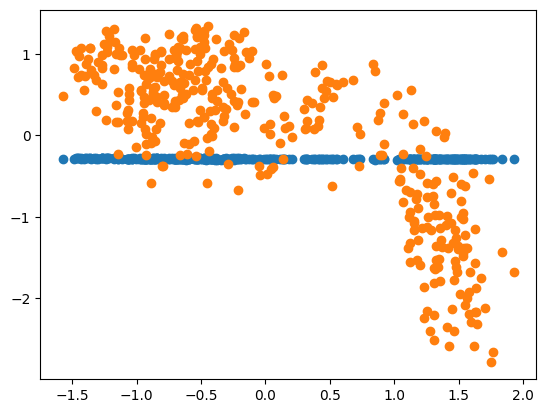

In [ ]:
plt.scatter(X_test[:,0].detach().numpy(),y_preds.detach().numpy())
plt.scatter(X_test[:,0].detach().numpy(),y_test)

# Attempt 3 - it did not work i hate everything right now sorry for the spoilers

I'm going to remove some layers and nodes from my model and see if I can get it to work.

In [9]:
model_3 = nn.Sequential(
    nn.Linear(in_features=5, out_features=16,),
    nn.RReLU(),

    #hidden layer with 16 nodes
    nn.Linear(in_features=16, out_features=4, ),
    nn.RReLU(),


    #hidden layer with 4 nodes
    nn.Linear(in_features=4, out_features=1, ),
)
model_3 = model_3.double()

In [10]:
# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer
optimizer = torch.optim.SGD(params=model_3.parameters(),
                            lr=0.0001)

In [11]:
epochs = 2000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_3.train()

    # 1. Forward pass; makes predictions
    y_pred = model_3(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred.squeeze(), y_train)

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_3.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_3(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([1571, 1])) that is different to the input size (torch.Size([1571])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch: 0 | Train loss: 1.14112, Test loss: 1.15536
Epoch: 200 | Train loss: 1.12395, Test loss: 1.12614
Epoch: 400 | Train loss: 1.10917, Test loss: 1.10068
Epoch: 600 | Train loss: 1.09606, Test loss: 1.07850
Epoch: 800 | Train loss: 1.08482, Test loss: 1.05918
Epoch: 1000 | Train loss: 1.07506, Test loss: 1.04239
Epoch: 1200 | Train loss: 1.06681, Test loss: 1.02785
Epoch: 1400 | Train loss: 1.05965, Test loss: 1.01534
Epoch: 1600 | Train loss: 1.05325, Test loss: 1.00457
Epoch: 1800 | Train loss: 1.04799, Test loss: 0.99534


The training loss and test loss looks best in this test. Let's see how the visualization looks.

In [12]:
model_3.eval()
with torch.inference_mode():
    y_preds = model_3(X_test)

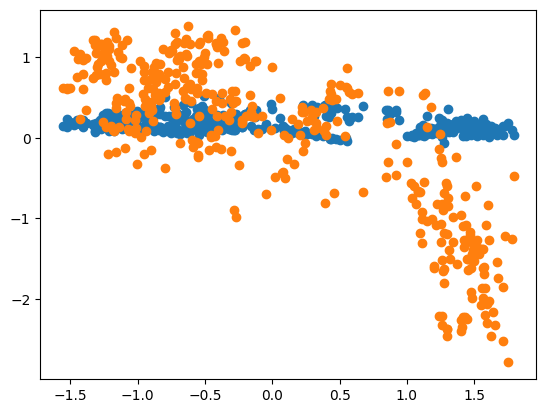

In [13]:
plt.scatter(X_test[:,0].detach().numpy(),y_preds.detach().numpy())
plt.scatter(X_test[:,0].detach().numpy(),y_test)

Hold on, let me graph it separately. There might be something off with the scale.

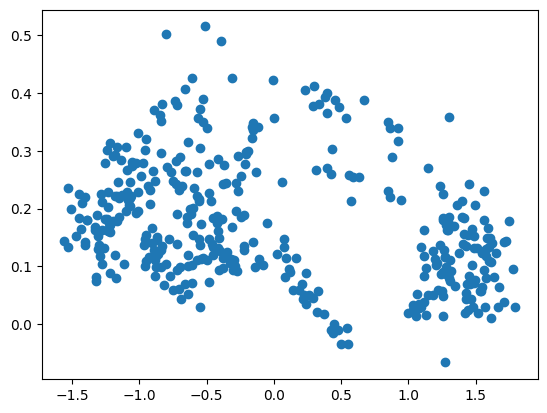

In [14]:
plt.scatter(X_test[:,0].detach().numpy(),y_preds.detach().numpy())

Dang it. I'm going to try again. Maybe it's the RReLU bits that are causing a problem.

# Attempts 4+ (It might have been the RReLU, but we'll never know)

I got tired of copying and pasting everything whenever I wanted to make a tiny little change. I'm going to try a LOT of different things here, so I'm leaving a log in the text box below. Be warned, it might not be the most scientific, as I don't *totally* know what I'm doing. Neural networks are HARD.

1) Removed RReLU - no improvement

2) Added more layers - slight improvement? not much though

3) Added RReLU back in - no improvement

4) tried Tanh - nothing

5) took that away - still bad

6) removed some layers -liiiiiiiitle bit better?

7) Removed one more layer - WHOA HEY IT LOOKS ALRIGHT

8) Removed one more layer - oh i shouldn't have pushed my luck. it's bad again.

9+) I added a Tanh function to try and help it. It kind of worked. This is what you see below.

In [104]:
model_4 = nn.Sequential(
    nn.Linear(in_features=5, out_features=8,),
    nn.Linear(in_features=8, out_features=4),
    nn.Tanh(),
    nn.Linear(in_features=4, out_features=1, ),
)
model_4 = model_4.double()

In [105]:
# Create a loss function
loss_fn = nn.MSELoss()

# Create an optimizer
optimizer = torch.optim.SGD(params=model_4.parameters(),
                            lr=0.0001)

In [106]:
epochs = 2000

for epoch in range(epochs):
    ### Training

    #this allows our matrices to update
    model_4.train()

    # 1. Forward pass; makes predictions
    y_pred = model_4(X_train)

    # 2. Calculate loss; how bad were our predictions?
    loss = loss_fn(y_pred.squeeze(), y_train)

    # 3. Optimizer zero grad; resets how we change our model
    optimizer.zero_grad()

    # 4. Loss backwards; determines how to change our weights matrix
    loss.backward()

    # 5. Optimizer step; changes our weights matrix based on .backward()
    optimizer.step()

    ### Testing
    model_4.eval() #forces our matrices to stay the same
    with torch.inference_mode():
      # 1. Forward pass; makes predictions, but with test data
      test_pred = model_4(X_test)
      # 2. Calculate the loss, but with test data
      test_loss = loss_fn(test_pred, y_test)

    # Print out what's happening
    if epoch % 200 == 0: #prints every 200 epochs
        print(f"Epoch: {epoch} | Train loss: {loss:.5f}, Test loss: {test_loss:.5f}")

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/loss.py:610: UserWarning: Using a target size (torch.Size([1571, 1])) that is different to the input size (torch.Size([1571])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch: 0 | Train loss: 1.23055, Test loss: 1.12294
Epoch: 200 | Train loss: 1.20619, Test loss: 1.10086
Epoch: 400 | Train loss: 1.18448, Test loss: 1.08129
Epoch: 600 | Train loss: 1.16511, Test loss: 1.06393
Epoch: 800 | Train loss: 1.14781, Test loss: 1.04853
Epoch: 1000 | Train loss: 1.13237, Test loss: 1.03487
Epoch: 1200 | Train loss: 1.11856, Test loss: 1.02275
Epoch: 1400 | Train loss: 1.10622, Test loss: 1.01200
Epoch: 1600 | Train loss: 1.09518, Test loss: 1.00247
Epoch: 1800 | Train loss: 1.08531, Test loss: 0.99404


In [107]:
model_4.eval()
with torch.inference_mode():
    y_preds = model_4(X_test)

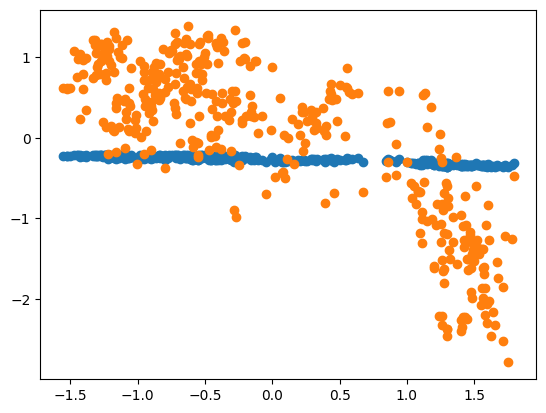

In [108]:
plt.scatter(X_test[:,0].detach().numpy(),y_preds.detach().numpy())
plt.scatter(X_test[:,0].detach().numpy(),y_test)

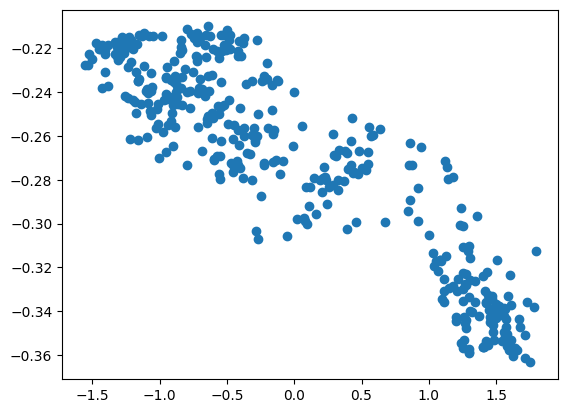

In [109]:
plt.scatter(X_test[:,0].detach().numpy(),y_preds.detach().numpy())

This looks the best out of everything so far. I've been pulling my hair out at this model for the last hour, so I might consider this to be my last test. This looks to be the best-performing neural network out of everything I've made so far. It's weird that the scaling is so off, though. I genuinely have no idea why that's happening.

# Conclusion

Welp. I couldn't get it to work. I must admit, I'm a little upset with myself, but honestly, I don't know what I was expecting. I've never worked with neural networks before, so it tracks that I couldn't get a model to run in just a couple weeks.

The last model should have been a straight line in the end with a negative slope. I tried so much to get it to function better, but whenever the NN made a straight line, it was always with a positive slope, when it seems like the salinity category in my data decreases when other variables increase. Increasing the number of epochs might have helped, and if I had more time I would probably try messing around with some of that. I think my NN might have ended up a bit too complex, because it looks like it almost started overfitting, especially in the last model. The predictions look VERY similar to the data, even though they should have just been a straight line.

In terms of variables, I can give a brief rundown on why I picked the ones I did. I went with temperature because solubility increases with higher temperature, dissolved oxygen because it might bond with salt in some way to hold it more, and chlorophyl and fDOM because more organic stuff in the water may indicate less salinity.

Something worth noting: I'm not sure the salinity category in my data is properly calibrated. I have a feeling the bouy used to gather the data is a little faulty. This might have led to complications that threw off the neural network and any calculations it made.

This is probably the last time I'll make a neural network, at least for a while. I had fun for a while, but by the end I was exasperated, just trying to get my model right.

This was a cool class.